# Carlisle Crash Data Analysis 

in this Jupyter notebook several crash datasets will be opened and merged for later analysis of Pennsylvania Cumberland County, Carlisle and greater Carlisle.

Penn DOT Crash Data https://pennshare.maps.arcgis.com/apps/webappviewer/index.html?id=8fdbf046e36e41649bbfd9d7dd7c7e7e click on here hyperlink to obtain dictionary

Census API discovery tool https://www.census.gov/data/developers/updates/new-discovery-tool.html

In [512]:
#import necessary libraries 
#

import requests
import json, csv
from pathlib import Path  

# import data handling libraries 
import numpy as np
import pandas as pd
import requests
import json
#from dateutil.rrule import rrule, DAILY, MONTHLY
#from datetime import  timedelta


#import graphing libraries 
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

#Import Mapping Libraries 

import cartopy.crs as ccrs
import cartopy.io.img_tiles as cimgt

#set Jupyter Notebook Display 
pd.set_option('display.max_rows', 1000)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)
pd.options.display.float_format = '{:,.6f}'.format

from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))


In [419]:
# Set Global 
# 10 year period 2012 - 2021
# 5 year period 2017 - 2021

END_YEAR = 2021
START_YEAR = 2012 

# set the municipality [Municipal Name, PennDoT ID, ACS County, ACS County Subdivision Code]
# Penn Dots Municipal ID for Carlisle : 21402
# Cumberland County ACS ID Num : 041
# Carlisle Subdivision ACS ID: 
MUNICIPALITY_PENN_DoT_ID = 21402
MUNICIPALITY_ACS_COUUNTY = '041'
MUNICIPALITY_ACS_SUBDIVISION = '11272'


# Import State Crash Data From CSV to Dataframe

In [420]:
# Import State Crash Data 

#start by importing the latest available years crash .csv file 
CRASH_DF = pd.read_csv('../../../Data_Work/data_folder/Crash_Data_PA/PA_CRASH_{}/CRASH_{}_Statewide.csv'.format(END_YEAR,END_YEAR),
                        dtype={'user_id': int})

# import the other years by counting backwards from the second last year in the time frame window
for i in range(END_YEAR-1,START_YEAR,-1):
    newcrash_df = pd.read_csv('../../../Data_Work/data_folder/Crash_Data_PA/PA_CRASH_{}/CRASH_{}_Statewide.csv'.format(i,i),
                        dtype={'user_id': int})
    CRASH_DF = CRASH_DF.append(newcrash_df)
    
# delete the data frame used to append to the original     
del(newcrash_df)

#print the length of the dataframe 
print("original dataframe length {}".format(len(CRASH_DF)))

#Exclude all data except for those in the designated municipality 
CRASH_DF =CRASH_DF[CRASH_DF["MUNICIPALITY"] == MUNICIPALITY_PENN_DoT_ID]

#print the length of the dataframe 
print("Local dataframe length {}".format(len(CRASH_DF)))

#show the first 5 rows  of the crash dataframe 
CRASH_DF.head()
 

/home/mitch/anaconda3/lib/python3.9/site-packages/IPython/core/interactiveshell.py:3444: DtypeWarning: Columns (94,96) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)
/home/mitch/anaconda3/lib/python3.9/site-packages/IPython/core/interactiveshell.py:3444: DtypeWarning: Columns (94,96,97,98) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)
/home/mitch/anaconda3/lib/python3.9/site-packages/IPython/core/interactiveshell.py:3444: DtypeWarning: Columns (97,98) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)
/home/mitch/anaconda3/lib/python3.9/site-packages/IPython/core/interactiveshell.py:3444: DtypeWarning: Columns (94) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


original dataframe length 1107637
Local dataframe length 1913


,ARRIVAL_TM,AUTOMOBILE_COUNT,BELTED_DEATH_COUNT,BELTED_SUSP_SERIOUS_INJ_COUNT,BICYCLE_COUNT,BICYCLE_DEATH_COUNT,BICYCLE_SUSP_SERIOUS_INJ_COUNT,BUS_COUNT,CHLDPAS_DEATH_COUNT,CHLDPAS_SUSP_SERIOUS_INJ_COUNT,COLLISION_TYPE,COMM_VEH_COUNT,CONS_ZONE_SPD_LIM,COUNTY,CRASH_MONTH,CRASH_YEAR,CRN,DAY_OF_WEEK,DEC_LAT,DEC_LONG,DISPATCH_TM,DISTRICT,DRIVER_COUNT_16YR,DRIVER_COUNT_17YR,DRIVER_COUNT_18YR,DRIVER_COUNT_19YR,DRIVER_COUNT_20YR,DRIVER_COUNT_50_64YR,DRIVER_COUNT_65_74YR,DRIVER_COUNT_75PLUS,EST_HRS_CLOSED,FATAL_COUNT,HEAVY_TRUCK_COUNT,HORSE_BUGGY_COUNT,HOUR_OF_DAY,ILLUMINATION,INJURY_COUNT,INTERSECT_TYPE,LANE_CLOSED,LATITUDE,LN_CLOSE_DIR,LOCATION_TYPE,LONGITUDE,MAX_SEVERITY_LEVEL,MCYCLE_DEATH_COUNT,MCYCLE_SUSP_SERIOUS_INJ_COUNT,MOTORCYCLE_COUNT,MUNICIPALITY,NONMOTR_COUNT,NONMOTR_DEATH_COUNT,NONMOTR_SUSP_SERIOUS_INJ_COUNT,NTFY_HIWY_MAINT,PED_COUNT,PED_DEATH_COUNT,PED_SUSP_SERIOUS_INJ_COUNT,PERSON_COUNT,POLICE_AGCY,POSSIBLE_INJ_COUNT,RDWY_SURF_TYPE_CD,RELATION_TO_ROAD,ROAD_CONDITION,SCH_BUS_IND,SCH_ZONE_IND,SMALL_TRUCK_COUNT,SPEC_JURIS_CD,SUSP_MINOR_INJ_COUNT,SUSP_SERIOUS_INJ_COUNT,SUV_COUNT,TCD_FUNC_CD,TCD_TYPE,TFC_DETOUR_IND,TIME_OF_DAY,TOT_INJ_COUNT,TOTAL_UNITS,UNB_DEATH_COUNT,UNB_SUSP_SERIOUS_INJ_COUNT,UNBELTED_OCC_COUNT,UNK_INJ_DEG_COUNT,UNK_INJ_PER_COUNT,URBAN_RURAL,VAN_COUNT,VEHICLE_COUNT,WORK_ZONE_IND,WORK_ZONE_LOC,WORK_ZONE_TYPE,WORKERS_PRES,WZ_CLOSE_DETOUR,WZ_FLAGGER,WZ_LAW_OFFCR_IND,WZ_LN_CLOSURE,WZ_MOVING,WZ_OTHER,WZ_SHLDER_MDN,ROADWAY_CLEARED,WEATHER1,WEATHER2,WZ_WORKERS_INJ_KILLED,SECONDARY_CRASH,INTERSECTION_RELATED
175,"1,143.000000",1,0,0,0,0,0,0,0,0,1,0,NaN,21,1,2021,2021000524,7,40.200600,-77.178900,"1,141.000000",8,0,0,0,0,1,1,0,0,NaN,0,0,0.000000,11.000000,1,0,0,0,40 12:02.337,NaN,0,77 10:44.212,0,0,0,0,21402,0,0,0,N,0,0,0,2,21402,0,NaN,1.000000,1.000000,N,N,0,NaN,0,0,1,0.000000,0,NaN,"1,141.000000",0,2,0,0,0,0,0,2,0,2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.000000,NaN,N,N
947,135.000000,0,0,0,0,0,0,0,0,0,7,0,NaN,21,1,2021,2021002198,5,40.194600,-77.187400,130.000000,8,0,0,0,0,0,0,0,1,NaN,0,0,0.000000,1.000000,3,1,2,2,40 11:40.642,7.000000,0,77 11:14.510,3,0,0,0,21402,0,0,0,Y,0,0,0,1,21402,0,NaN,5.000000,1.000000,N,N,1,NaN,1,0,0,3.000000,3,N,130.000000,1,1,0,0,0,0,0,2,0,1,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230.000000,NaN,3.000000,NaN,N,N
1374,"1,804.000000",2,0,0,0,0,0,0,0,0,1,0,NaN,21,1,2021,2021002931,6,40.202200,-77.197400,"1,754.000000",8,0,1,0,0,0,0,1,0,NaN,0,0,0.000000,17.000000,3,1,0,0,40 12:07.808,NaN,0,77 11:50.495,3,0,0,0,21402,0,0,0,N,0,0,0,3,21402,0,NaN,1.000000,1.000000,N,N,0,NaN,1,0,0,3.000000,8,NaN,"1,750.000000",1,2,0,0,0,0,0,2,0,2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.000000,NaN,N,N
1405,"1,053.000000",1,0,0,0,0,0,0,0,0,4,0,NaN,21,1,2021,2021002981,7,40.202800,-77.208100,"1,051.000000",8,0,0,0,0,0,1,0,0,NaN,0,0,0.000000,10.000000,1,0,1,2,40 12:10.049,5.000000,0,77 12:29.246,0,0,0,0,21402,0,0,0,N,0,0,0,2,21402,0,NaN,1.000000,1.000000,N,N,0,NaN,0,0,1,3.000000,2,Y,"1,048.000000",0,2,0,0,0,0,0,2,0,2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"1,152.000000",NaN,3.000000,NaN,N,NaN
2775,"1,935.000000",1,0,0,0,0,0,0,0,0,4,0,NaN,21,1,2021,2021005038,6,40.204000,-77.200600,"1,932.000000",8,0,0,0,0,0,0,1,0,NaN,0,0,0.000000,19.000000,3,0,1,0,40 12:14.428,NaN,0,77 12:02.224,0,0,0,0,21402,0,0,0,N,0,0,0,2,21402,0,NaN,1.000000,9.000000,N,N,0,NaN,0,0,1,3.000000,3,NaN,"1,932.000000",0,2,0,0,0,0,0,2,0,2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.000000,NaN,N,NaN


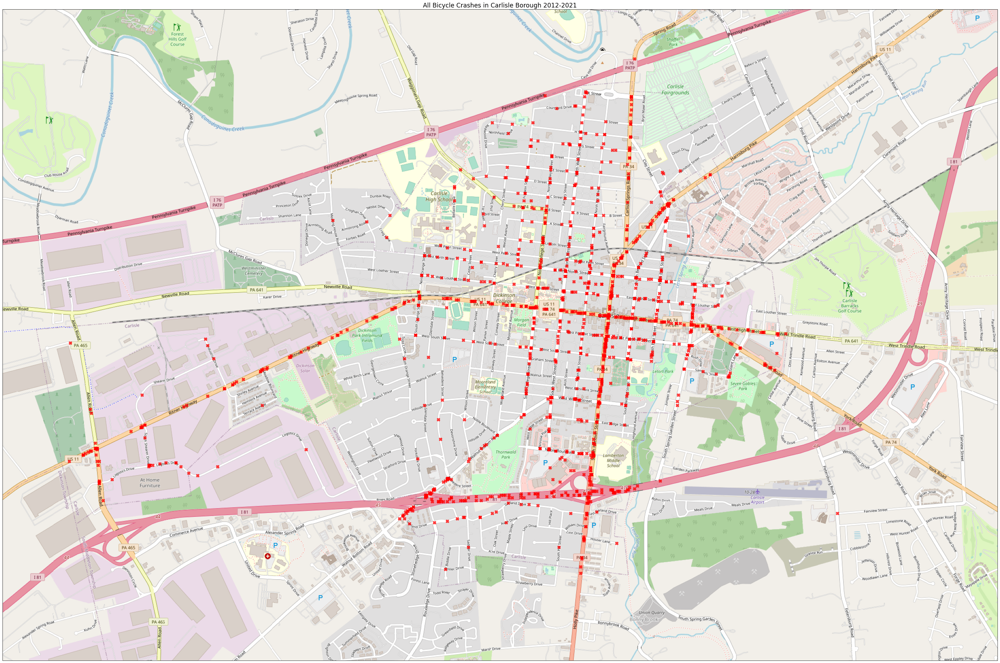

In [513]:
# Map All Carlisle Crashes To Be Sure You have the right Location 

DATA =CRASH_DF

#(traffic_df['BICYCLE_SUSP_SERIOUS_INJ_COUNT']>0)]#&
#Set variables
X=DATA["DEC_LONG"]
Y=DATA["DEC_LAT"]




request = cimgt.OSM()
fig, ax = plt.subplots(figsize=(50,35),
                       subplot_kw=dict(projection=request.crs))
extent = [-77.25,-77.15,40.175,40.225]  # (xmin, xmax, ymin, ymax)
ax.set_extent(extent)
ax.add_image(request, 15)

#plot the regular crashes
plt.scatter(X,Y,
            #color=traffic_df["AUTOMOBILE_COUNT"][(traffic_df['MUNICIPALITY']== 21402)&(traffic_df["BICYCLE_COUNT"]!=0)],
            color= 'r',
            alpha=0.75,
            s=75,
            marker='X',
            zorder=100,
            transform=ccrs.PlateCarree()) ## Important

plt.title('All Bicycle Crashes in Carlisle Borough 2012-2021', fontsize='xx-large')

del(DATA)

plt.show()

# Import Roadway Data

In [421]:
#import PA roadway crash data pdf

# ROAD_OWNER
# 1 - Interstate – (non-turnpike)
# 2 - State highway
# 3 - County road
# 4 - Local road or street
# 5 - East-West portion of turnpike
# 6 - Turnpike spur (extension)
# 7 - Private Road
# 9 - Other or Unknown



#/home/mitch/Data_Work/data_folder/Crash_Data_PA/PA_CRASH_2021/ROADWAY_2021_Statewide.csv

Roadway_df = pd.read_csv('../../../Data_Work/data_folder/Crash_Data_PA/PA_CRASH_{}/ROADWAY_{}_Statewide.csv'.format(END_YEAR,END_YEAR),encoding='utf8')

for i in range(END_YEAR-1,START_YEAR,-1):
    try:
        newRoadway_df = pd.read_csv('../../../Data_Work/data_folder/Crash_Data_PA/PA_CRASH_{}/ROADWAY_{}_Statewide.csv'.format(i,i), encoding='utf8')
        Roadway_df = Roadway_df.append(newRoadway_df)
    except:
        None
       # print(i)

del(newRoadway_df)

print(len(Roadway_df))


/home/mitch/anaconda3/lib/python3.9/site-packages/IPython/core/interactiveshell.py:3444: DtypeWarning: Columns (3) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)
/home/mitch/anaconda3/lib/python3.9/site-packages/IPython/core/interactiveshell.py:3444: DtypeWarning: Columns (4) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


1733205


In [422]:
Roadway_df.head()

,CRN,RDWY_SEQ_NUM,ADJ_RDWY_SEQ,ROUTE,SEGMENT,OFFSET,RDWY_ORIENT,LANE_COUNT,SPEED_LIMIT,STREET_NAME,ROAD_OWNER,ACCESS_CTRL,RDWY_COUNTY
0,2021068496,3,3,2053,90.000000,"1,523.000000",N,2.000000,40.000000,OXFORD VALLEY RD,2,3.000000,9
1,2021068496,4,4,2053,91.000000,"1,520.000000",S,2.000000,40.000000,OXFORD VALLEY RD,2,3.000000,9
2,2021068496,5,5,NaN,NaN,NaN,W,2.000000,25.000000,AUSTIN DR,4,NaN,9
3,2021073949,3,4,0030,41.000000,0.000000,W,2.000000,35.000000,LANCASTER AV,2,3.000000,23
4,2021073949,4,6,CB1G,121.000000,"1,268.000000",S,2.000000,25.000000,MARTIN AV,4,NaN,23


In [423]:
#USE One Hot Encoding to seperate the road owner into different variable columns 

#reset the roadway data frame index
Roadway_df.reset_index(inplace=True)
Roadway_df.drop(columns=("index"), inplace=True)

#one hot encode the roadway owner into a new dataframe called one hot
one_hot = pd.get_dummies(Roadway_df['ROAD_OWNER'])
one_hot_df = pd.DataFrame(one_hot)
one_hot_df.reset_index(inplace=True)
one_hot_df.drop(columns=("index"), inplace=True)

#join the one hot data frame to the Roadway data frame
Roadway_df = Roadway_df.join(one_hot_df)

#rename columns to match the dictionary 
# ROAD_OWNER
# 1 - Interstate – (non-turnpike)
# 2 - State highway
# 3 - County road
# 4 - Local road or street
# 5 - East-West portion of turnpike
# 6 - Turnpike spur (extension)
# 7 - Private Road
# 9 - Other or Unknown
Roadway_df = Roadway_df.rename(columns={1.0:'Interstate',
                                       2.0:'State_highway',
                                       3.0:'County_road',
                                       4.0:'Local_road_or_street',
                                       5.0:'East-West_portion_of_turnpike',
                                       6.0:'Turnpike_spur_(extension)',
                                       7.0:'Private_Road',
                                       9.0:"Other_or_Unknown"})

#ensure the dataframes are the same length 
print(len(one_hot_df))
print(len(Roadway_df))

Roadway_df.head()

1733205
1733205


,CRN,RDWY_SEQ_NUM,ADJ_RDWY_SEQ,ROUTE,SEGMENT,OFFSET,RDWY_ORIENT,LANE_COUNT,SPEED_LIMIT,STREET_NAME,ROAD_OWNER,ACCESS_CTRL,RDWY_COUNTY,Interstate,State_highway,County_road,Local_road_or_street,East-West_portion_of_turnpike,Turnpike_spur_(extension),Private_Road,Other_or_Unknown
0,2021068496,3,3,2053,90.000000,"1,523.000000",N,2.000000,40.000000,OXFORD VALLEY RD,2,3.000000,9,0,1,0,0,0,0,0,0
1,2021068496,4,4,2053,91.000000,"1,520.000000",S,2.000000,40.000000,OXFORD VALLEY RD,2,3.000000,9,0,1,0,0,0,0,0,0
2,2021068496,5,5,NaN,NaN,NaN,W,2.000000,25.000000,AUSTIN DR,4,NaN,9,0,0,0,1,0,0,0,0
3,2021073949,3,4,0030,41.000000,0.000000,W,2.000000,35.000000,LANCASTER AV,2,3.000000,23,0,1,0,0,0,0,0,0
4,2021073949,4,6,CB1G,121.000000,"1,268.000000",S,2.000000,25.000000,MARTIN AV,4,NaN,23,0,0,0,1,0,0,0,0


In [424]:
#pivot roadway data to CRNs for merge with crash dataframe 
CRN_Pivot_road_data = pd.pivot_table(Roadway_df,values=('Interstate',
                                                         'State_highway',
                                                         'County_road',
                                                         'Local_road_or_street',
                                                         'East-West_portion_of_turnpike',
                                                         'Turnpike_spur_(extension)',
                                                         'Private_Road',
                                                         'Other_or_Unknown'), index='CRN', aggfunc='sum')
CRN_Pivot_road_data.head()
# Quick test that found a POSSIBLE_ERROR -O
#CRN_Pivot_road_data.sum(axis=1) # can any row have multiple locations? -O
#sum(CRN_Pivot_road_data.sum(axis=1)) - len(CRN_Pivot_road_data.sum(axis=1)) # apparently they can -O


,County_road,East-West_portion_of_turnpike,Interstate,Local_road_or_street,Other_or_Unknown,Private_Road,State_highway,Turnpike_spur_(extension)
CRN,,,,,,,,
2012032743,0,0,0,2,0,0,2,0
2012083035,0,0,0,2,0,0,0,0
2012132607,0,0,0,2,0,0,0,0
2013000003,0,0,0,1,0,0,0,0
2013000005,0,0,0,2,0,0,0,0


In [425]:
#set Pivoted road data to integer values 
CRN_Pivot_road_data=CRN_Pivot_road_data[['Interstate',
                                         'State_highway',
                                         'County_road',
                                         'Local_road_or_street',
                                         'East-West_portion_of_turnpike',
                                         'Turnpike_spur_(extension)',
                                         'Private_Road', 'Other_or_Unknown']].astype(int)

#merge the road data and the original Crash Dataframe
CRASH_DF = pd.merge(CRASH_DF,CRN_Pivot_road_data, how='left', left_on='CRN',right_on='CRN')


CRASH_DF[['Interstate',
         'State_highway',
         'County_road',
         'Local_road_or_street',
         'East-West_portion_of_turnpike',
         'Turnpike_spur_(extension)',
         'Private_Road', 'Other_or_Unknown']].fillna(0, inplace=True)

"""CRASH_DF[['Interstate',
         'State_highway',
         'County_road',
         'Local_road_or_street',
         'East-West_portion_of_turnpike',
         'Turnpike_spur_(extension)',
         'Private_Road', 'Other_or_Unknown']]=CRASH_DF[['Interstate',
                                                         'State_highway',
                                                         'County_road',
                                                         'Local_road_or_street',
                                                         'East-West_portion_of_turnpike',
                                                         'Turnpike_spur_(extension)',
                                                         'Private_Road', 'Other_or_Unknown']].astype(int)
"""
CRN_Pivot_road_data.head()
print(len(CRN_Pivot_road_data))
print(len(CRASH_DF))

CRASH_DF.head()

1107637
1913


/home/mitch/anaconda3/lib/python3.9/site-packages/pandas/core/frame.py:5176: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


,ARRIVAL_TM,AUTOMOBILE_COUNT,BELTED_DEATH_COUNT,BELTED_SUSP_SERIOUS_INJ_COUNT,BICYCLE_COUNT,BICYCLE_DEATH_COUNT,BICYCLE_SUSP_SERIOUS_INJ_COUNT,BUS_COUNT,CHLDPAS_DEATH_COUNT,CHLDPAS_SUSP_SERIOUS_INJ_COUNT,COLLISION_TYPE,COMM_VEH_COUNT,CONS_ZONE_SPD_LIM,COUNTY,CRASH_MONTH,CRASH_YEAR,CRN,DAY_OF_WEEK,DEC_LAT,DEC_LONG,DISPATCH_TM,DISTRICT,DRIVER_COUNT_16YR,DRIVER_COUNT_17YR,DRIVER_COUNT_18YR,DRIVER_COUNT_19YR,DRIVER_COUNT_20YR,DRIVER_COUNT_50_64YR,DRIVER_COUNT_65_74YR,DRIVER_COUNT_75PLUS,EST_HRS_CLOSED,FATAL_COUNT,HEAVY_TRUCK_COUNT,HORSE_BUGGY_COUNT,HOUR_OF_DAY,ILLUMINATION,INJURY_COUNT,INTERSECT_TYPE,LANE_CLOSED,LATITUDE,LN_CLOSE_DIR,LOCATION_TYPE,LONGITUDE,MAX_SEVERITY_LEVEL,MCYCLE_DEATH_COUNT,MCYCLE_SUSP_SERIOUS_INJ_COUNT,MOTORCYCLE_COUNT,MUNICIPALITY,NONMOTR_COUNT,NONMOTR_DEATH_COUNT,NONMOTR_SUSP_SERIOUS_INJ_COUNT,NTFY_HIWY_MAINT,PED_COUNT,PED_DEATH_COUNT,PED_SUSP_SERIOUS_INJ_COUNT,PERSON_COUNT,POLICE_AGCY,POSSIBLE_INJ_COUNT,RDWY_SURF_TYPE_CD,RELATION_TO_ROAD,ROAD_CONDITION,SCH_BUS_IND,SCH_ZONE_IND,SMALL_TRUCK_COUNT,SPEC_JURIS_CD,SUSP_MINOR_INJ_COUNT,SUSP_SERIOUS_INJ_COUNT,SUV_COUNT,TCD_FUNC_CD,TCD_TYPE,TFC_DETOUR_IND,TIME_OF_DAY,TOT_INJ_COUNT,TOTAL_UNITS,UNB_DEATH_COUNT,UNB_SUSP_SERIOUS_INJ_COUNT,UNBELTED_OCC_COUNT,UNK_INJ_DEG_COUNT,UNK_INJ_PER_COUNT,URBAN_RURAL,VAN_COUNT,VEHICLE_COUNT,WORK_ZONE_IND,WORK_ZONE_LOC,WORK_ZONE_TYPE,WORKERS_PRES,WZ_CLOSE_DETOUR,WZ_FLAGGER,WZ_LAW_OFFCR_IND,WZ_LN_CLOSURE,WZ_MOVING,WZ_OTHER,WZ_SHLDER_MDN,ROADWAY_CLEARED,WEATHER1,WEATHER2,WZ_WORKERS_INJ_KILLED,SECONDARY_CRASH,INTERSECTION_RELATED,Interstate,State_highway,County_road,Local_road_or_street,East-West_portion_of_turnpike,Turnpike_spur_(extension),Private_Road,Other_or_Unknown
0,"1,143.000000",1,0,0,0,0,0,0,0,0,1,0,NaN,21,1,2021,2021000524,7,40.200600,-77.178900,"1,141.000000",8,0,0,0,0,1,1,0,0,NaN,0,0,0.000000,11.000000,1,0,0,0,40 12:02.337,NaN,0,77 10:44.212,0,0,0,0,21402,0,0,0,N,0,0,0,2,21402,0,NaN,1.000000,1.000000,N,N,0,NaN,0,0,1,0.000000,0,NaN,"1,141.000000",0,2,0,0,0,0,0,2,0,2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.000000,NaN,N,N,0,1,0,0,0,0,0,0
1,135.000000,0,0,0,0,0,0,0,0,0,7,0,NaN,21,1,2021,2021002198,5,40.194600,-77.187400,130.000000,8,0,0,0,0,0,0,0,1,NaN,0,0,0.000000,1.000000,3,1,2,2,40 11:40.642,7.000000,0,77 11:14.510,3,0,0,0,21402,0,0,0,Y,0,0,0,1,21402,0,NaN,5.000000,1.000000,N,N,1,NaN,1,0,0,3.000000,3,N,130.000000,1,1,0,0,0,0,0,2,0,1,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230.000000,NaN,3.000000,NaN,N,N,0,0,0,2,0,0,0,0
2,"1,804.000000",2,0,0,0,0,0,0,0,0,1,0,NaN,21,1,2021,2021002931,6,40.202200,-77.197400,"1,754.000000",8,0,1,0,0,0,0,1,0,NaN,0,0,0.000000,17.000000,3,1,0,0,40 12:07.808,NaN,0,77 11:50.495,3,0,0,0,21402,0,0,0,N,0,0,0,3,21402,0,NaN,1.000000,1.000000,N,N,0,NaN,1,0,0,3.000000,8,NaN,"1,750.000000",1,2,0,0,0,0,0,2,0,2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.000000,NaN,N,N,0,1,0,0,0,0,0,0
3,"1,053.000000",1,0,0,0,0,0,0,0,0,4,0,NaN,21,1,2021,2021002981,7,40.202800,-77.208100,"1,051.000000",8,0,0,0,0,0,1,0,0,NaN,0,0,0.000000,10.000000,1,0,1,2,40 12:10.049,5.000000,0,77 12:29.246,0,0,0,0,21402,0,0,0,N,0,0,0,2,21402,0,NaN,1.000000,1.000000,N,N,0,NaN,0,0,1,3.000000,2,Y,"1,048.000000",0,2,0,0,0,0,0,2,0,2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"1,152.000000",NaN,3.000000,NaN,N,NaN,0,3,0,2,0,0,0,0
4,"1,935.000000",1,0,0,0,0,0,0,0,0,4,0,NaN,21,1,2021,2021005038,6,40.204000,-77.200600,"1,932.000000",8,0,0,0,0,0,0,1,0,NaN,0,0,0.000000,19.000000,3,0,1,0,40 12:14.428,NaN,0,77 12:02.224,0,0,0,0,21402,0,0,0,N,0,0,0,2,21402,0,NaN,1.000000,9.000000,N,N,0,NaN,0,0,1,3.000000,3,NaN,"1,932.000000",0,2,0,0,0,0,0,2,0,2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.000000,NaN,N,NaN,0,0,0,2,0,0,0,0


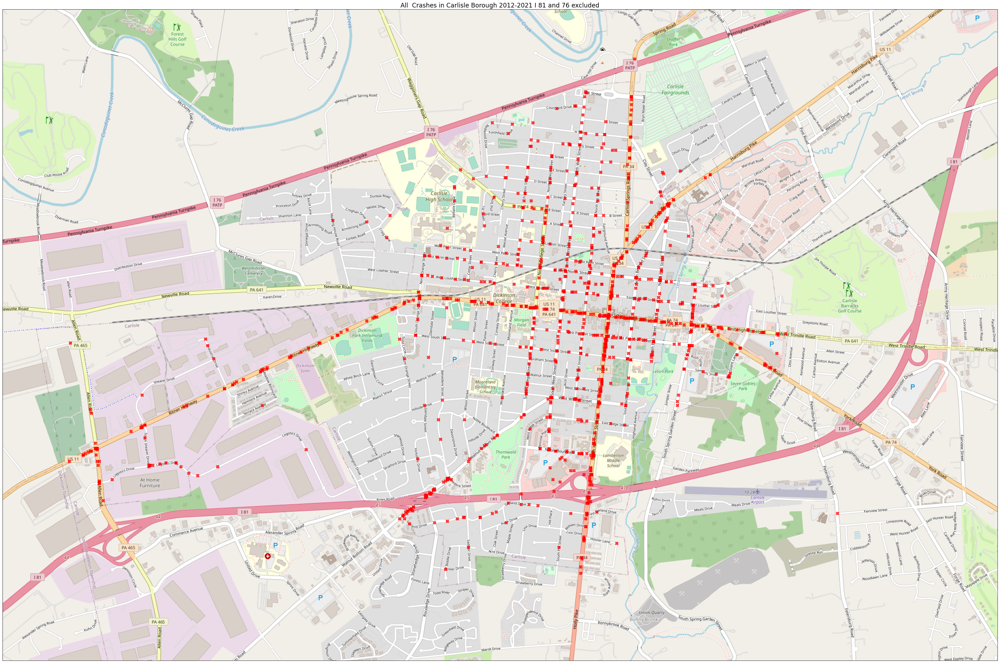

In [519]:
# Now Map All Carlisle Crashes To Be Sure You have the right Location and Exclude I-81 and 76

DATA =CRASH_DF[(CRASH_DF["East-West_portion_of_turnpike"]==0)&(CRASH_DF["Interstate"]==0)]

#(traffic_df['BICYCLE_SUSP_SERIOUS_INJ_COUNT']>0)]#&
#Set variables
X=DATA["DEC_LONG"]
Y=DATA["DEC_LAT"]




request = cimgt.OSM()
fig, ax = plt.subplots(figsize=(50,35),
                       subplot_kw=dict(projection=request.crs))
extent = [-77.25,-77.15,40.175,40.225]  # (xmin, xmax, ymin, ymax)
ax.set_extent(extent)
ax.add_image(request, 15)

#plot the regular crashes
plt.scatter(X,Y,
            #color=traffic_df["AUTOMOBILE_COUNT"][(traffic_df['MUNICIPALITY']== 21402)&(traffic_df["BICYCLE_COUNT"]!=0)],
            color= 'r',
            alpha=0.75,
            s=75,
            marker='X',
            zorder=100,
            transform=ccrs.PlateCarree()) ## Important

plt.title('All  Crashes in Carlisle Borough 2012-2021 I 81 and 76 excluded', fontsize='xx-large')

del(DATA)

plt.show()

# Query the American Comunity Survey (ACS)
https://api.census.gov/data/2011/acs/acs5?get=NAME,B00001_001E&for=county%20subdivision:01099&in=state:36%20county:029

Census Exploration tool:
https://api.census.gov/data/2021/acs/acs5/variables.html

In [426]:
# Query ACS data for Municipalities 

#Census API
HOST = 'https://api.census.gov/data'

#Year to get data for 
YEAR = '{}'.format(END_YEAR)#,2005,2010,2015,2020'  

# Survey to Access data from (ACS 5 year estimates)
DATA_SET = 'acs/acs5'
BASE_URL = '/'.join([HOST, YEAR, DATA_SET])

#create an empty dictionary for predicates 
predicates = {}

# ACS VARIABLES
# Population Estimate:                    B01003_001E
# Population Margin of error:             B01003_001M
# Bike to work Estimate:                  B08006_014E
# Bike to work Margin of error:           B08006_014M
# Walk to work Estimate:                  B08006_015E
# Walk to work Margin of error:           B08006_015M
# Drive to work alone Estimate:           B08006_003E
# Drive to work alone Margin of error:    B08006_003M
# Carpool to work Estimate:               B08006_004E
# Carpool to work Margin:                 B08006_004M
# Public transit to work Estimate:        B08006_008E
# Public transit to work Margin of Error: B08006_008E
# Other to Work Estimate :                B08006_016E
# Other to Work Margin of error:          B08006_016M
# Worked from Home Estimate:              B08006_017E
# Worked from Home Margin of Error:       B08006_017M


get_vars = ['NAME',
            'B01001_001E',
            'B08006_014E',
            'B08006_014M',
            'B08006_015E',
            'B08006_015M',
            'B08006_003E',
            'B08006_003M',
            'B08006_004E',
            'B08006_004M',
            'B08006_008E',
            'B08006_008M',
            'B08006_016E',
            'B08006_016M',
            'B08006_017E',
            'B08006_017M']

predicates['get']=','.join(get_vars)

#Set sub geographies to get data for ('county','Place','county subdivision) * means get all 
predicates['for']='county subdivision:{}'.format(MUNICIPALITY_ACS_SUBDIVISION)

# Set geography that contains sub geographies  (42=Pennslyvania )
predicates['in']='state:42%20county:{}'.format(MUNICIPALITY_ACS_COUUNTY)

#assemble the API query 
r = requests.get(BASE_URL, params = predicates)

#print the query URL 
print(BASE_URL,predicates)


https://api.census.gov/data/2021/acs/acs5 {'get': 'NAME,B01001_001E,B08006_014E,B08006_014M,B08006_015E,B08006_015M,B08006_003E,B08006_003M,B08006_004E,B08006_004M,B08006_008E,B08006_008M,B08006_016E,B08006_016M,B08006_017E,B08006_017M', 'for': 'county subdivision:11272', 'in': 'state:42%20county:041'}


In [427]:
#print the length and first thousand characters to see what you got 
print(len(r.text))
print(r.text[0:1000])


425
[["NAME","B01001_001E","B08006_014E","B08006_014M","B08006_015E","B08006_015M","B08006_003E","B08006_003M","B08006_004E","B08006_004M","B08006_008E","B08006_008M","B08006_016E","B08006_016M","B08006_017E","B08006_017M","state","county","county subdivision"],
["Carlisle borough, Cumberland County, Pennsylvania","19869","235","104","1052","222","6598","481","547","183","42","37","209","108","1054","263","42","041","11272"]]


In [428]:
#Place the Queried ACS data into a data frame 

# set the column names to the first row of data from the query 
column_names=r.json()[0:1][0]

#Set the data to everything after the first row and convert to an array to flatten it
ACS_DATA= r.json()[1:]
ACS_data = np.array(ACS_DATA)

#create the pandas data frame 
ACS_MUNI_DF = pd.DataFrame(columns=column_names , data = ACS_data)

# reset the index of the data frame
ACS_MUNI_DF.reset_index()

# rename the columns 
ACS_MUNI_DF.rename(columns ={"B01001_001E":"POPULATION",
                    "B08006_014E":'BIKE_TO_WORK_EST',
                    "B08006_014M":"BIKE_TO_WORK_MARG",
                    "B08006_015E":"WALK_TO_WORK_EST",
                    "B08006_015M":"WALK_TO_WORK_MARG",
                    'B08006_003E':"DRIVE_SOLO_TO_WORK_EST",
                    'B08006_003M':"DRIVE_SOLO_TO_WORK_MARG",
                    'B08006_004E':"CARPOOL_TO_WORK_EST",
                    'B08006_004M':"CARPOOL_TO_WORK_MARG",
                    'B08006_008E':"PUBTRANS_TO_WORK_EST",
                    'B08006_008M':"PUBTRANS_TO_WORK_MARG",
                    'B08006_016E':"OTHER(TAXI, MOTORCYCLE)TO_WORK_EST",
                    'B08006_016M':"OTHER(TAXI, MOTORCYCLE)TO_WORK_MARG",
                    'B08006_017E':"WORKED_FROM_HOME_EST",
                    'B08006_017M':"WORKED_FROM_HOME_MARG",
                    "county subdivision":"county_subdivision"}, inplace=True)

#convert the NAME column to strings 
ACS_MUNI_DF['NAME'] = ACS_MUNI_DF["NAME"].astype(str)

# remove Pennsylvania from NAME This is over redundant since all data will be from Pennsylvania 
ACS_MUNI_DF['NAME'] = ACS_MUNI_DF.NAME.replace({', Pennsylvania':''}, regex=True)

#create separate Name variables for county and municipality 
ACS_MUNI_DF[['MUNI_NAME','COUNTY_NAME']]=ACS_MUNI_DF['NAME'].str.split(',',expand=True)

# convert the variables to integers
ACS_MUNI_DF[["POPULATION",
                "BIKE_TO_WORK_EST",
                "BIKE_TO_WORK_MARG",
                "WALK_TO_WORK_EST",
                "WALK_TO_WORK_MARG",
                "DRIVE_SOLO_TO_WORK_EST",
                "DRIVE_SOLO_TO_WORK_MARG",
                "CARPOOL_TO_WORK_EST",
                "CARPOOL_TO_WORK_MARG",
                "PUBTRANS_TO_WORK_EST",
                "PUBTRANS_TO_WORK_MARG",
                "OTHER(TAXI, MOTORCYCLE)TO_WORK_EST",
                "OTHER(TAXI, MOTORCYCLE)TO_WORK_MARG",
                "WORKED_FROM_HOME_EST",
                "WORKED_FROM_HOME_MARG",
                "state",                 
                "county",                
                "county_subdivision"]] = ACS_MUNI_DF[["POPULATION",
                                            "BIKE_TO_WORK_EST",
                                            "BIKE_TO_WORK_MARG",
                                            "WALK_TO_WORK_EST",
                                            "WALK_TO_WORK_MARG",
                                            "DRIVE_SOLO_TO_WORK_EST",
                                            "DRIVE_SOLO_TO_WORK_MARG",
                                            "CARPOOL_TO_WORK_EST",
                                            "CARPOOL_TO_WORK_MARG",
                                            "PUBTRANS_TO_WORK_EST",
                                            "PUBTRANS_TO_WORK_MARG",
                                            "OTHER(TAXI, MOTORCYCLE)TO_WORK_EST",
                                            "OTHER(TAXI, MOTORCYCLE)TO_WORK_MARG",
                                            "WORKED_FROM_HOME_EST",
                                            "WORKED_FROM_HOME_MARG",
                                            "state",                 
                                            "county",                
                                            "county_subdivision"]].astype(int)
print(len(ACS_MUNI_DF))
ACS_MUNI_DF.head(3)


1


,NAME,POPULATION,BIKE_TO_WORK_EST,BIKE_TO_WORK_MARG,WALK_TO_WORK_EST,WALK_TO_WORK_MARG,DRIVE_SOLO_TO_WORK_EST,DRIVE_SOLO_TO_WORK_MARG,CARPOOL_TO_WORK_EST,CARPOOL_TO_WORK_MARG,PUBTRANS_TO_WORK_EST,PUBTRANS_TO_WORK_MARG,"OTHER(TAXI, MOTORCYCLE)TO_WORK_EST","OTHER(TAXI, MOTORCYCLE)TO_WORK_MARG",WORKED_FROM_HOME_EST,WORKED_FROM_HOME_MARG,state,county,county_subdivision,MUNI_NAME,COUNTY_NAME
0,"Carlisle borough, Cumberland County",19869,235,104,1052,222,6598,481,547,183,42,37,209,108,1054,263,42,41,11272,Carlisle borough,Cumberland County


[235, 1052, 547, 6598, 42, 209, 1054]


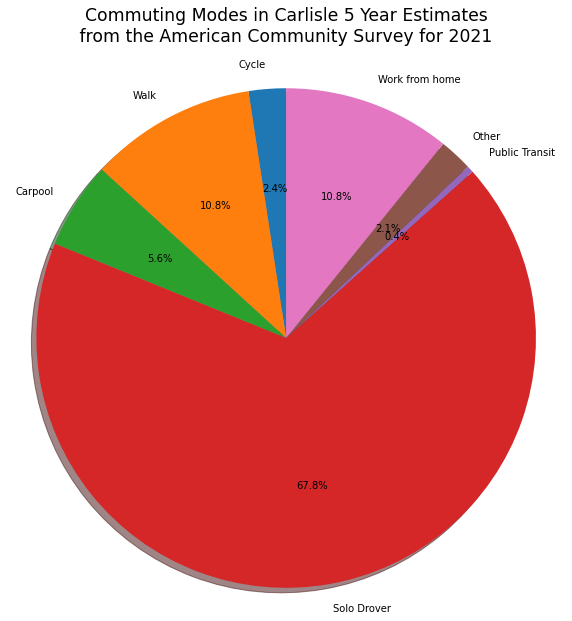

In [429]:
import matplotlib.pyplot as plt

# Pie chart, where the slices will be ordered and plotted counter-clockwise:
labels = 'Cycle', 'Walk', 'Carpool', 'Solo Drover','Public Transit','Other','Work from home'
sizes = ACS_MUNI_DF[['BIKE_TO_WORK_EST',
            'WALK_TO_WORK_EST',
             'CARPOOL_TO_WORK_EST',
            'DRIVE_SOLO_TO_WORK_EST',
            'PUBTRANS_TO_WORK_EST',
            'OTHER(TAXI, MOTORCYCLE)TO_WORK_EST',
                     'WORKED_FROM_HOME_EST']].values.tolist()[0]
print(sizes)
explode = (0, 0, 0, 0,0,0,0)  # only "explode" the 2nd slice (i.e. 'Hogs')

plt.figure(figsize=(10,10))
#fig1, ax1 = plt.subplots()

plt.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%',
        shadow=True, startangle=90)
#ax1.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%',
 #       shadow=True, startangle=90)
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

plt.title('Commuting Modes in Carlisle 5 Year Estimates\n from the American Community Survey for 2021 \n  ', fontsize='xx-large')
plt.show()

In [430]:
CRASH_DF['SUSP_SERIOUS_INJ_COUNT'].sum()

55

In [431]:
LOCAL_STREETS_CRASH_DF['SUSP_SERIOUS_INJ_COUNT'].sum()

54

In [432]:
# Create a data frame that excludes Interstate 81 and the Turnpike 

LOCAL_STREETS_CRASH_DF=CRASH_DF[(CRASH_DF['East-West_portion_of_turnpike']<1)& # not on Turnpike, uses Turnpike cols to exclude E/W turnpike
                                 (CRASH_DF['Interstate']<1)] # Not in interstate roads(I-81)
print(len(LOCAL_STREETS_CRASH_DF))

print(len(CRASH_DF))


1796
1913


In [450]:
LOCAL_STREETS_CRASH_DF[LOCAL_STREETS_CRASH_DF['FATAL_COUNT']>0].head(3)

,ARRIVAL_TM,AUTOMOBILE_COUNT,BELTED_DEATH_COUNT,BELTED_SUSP_SERIOUS_INJ_COUNT,BICYCLE_COUNT,BICYCLE_DEATH_COUNT,BICYCLE_SUSP_SERIOUS_INJ_COUNT,BUS_COUNT,CHLDPAS_DEATH_COUNT,CHLDPAS_SUSP_SERIOUS_INJ_COUNT,COLLISION_TYPE,COMM_VEH_COUNT,CONS_ZONE_SPD_LIM,COUNTY,CRASH_MONTH,CRASH_YEAR,CRN,DAY_OF_WEEK,DEC_LAT,DEC_LONG,DISPATCH_TM,DISTRICT,DRIVER_COUNT_16YR,DRIVER_COUNT_17YR,DRIVER_COUNT_18YR,DRIVER_COUNT_19YR,DRIVER_COUNT_20YR,DRIVER_COUNT_50_64YR,DRIVER_COUNT_65_74YR,DRIVER_COUNT_75PLUS,EST_HRS_CLOSED,FATAL_COUNT,HEAVY_TRUCK_COUNT,HORSE_BUGGY_COUNT,HOUR_OF_DAY,ILLUMINATION,INJURY_COUNT,INTERSECT_TYPE,LANE_CLOSED,LATITUDE,LN_CLOSE_DIR,LOCATION_TYPE,LONGITUDE,MAX_SEVERITY_LEVEL,MCYCLE_DEATH_COUNT,MCYCLE_SUSP_SERIOUS_INJ_COUNT,MOTORCYCLE_COUNT,MUNICIPALITY,NONMOTR_COUNT,NONMOTR_DEATH_COUNT,NONMOTR_SUSP_SERIOUS_INJ_COUNT,NTFY_HIWY_MAINT,PED_COUNT,PED_DEATH_COUNT,PED_SUSP_SERIOUS_INJ_COUNT,PERSON_COUNT,POLICE_AGCY,POSSIBLE_INJ_COUNT,RDWY_SURF_TYPE_CD,RELATION_TO_ROAD,ROAD_CONDITION,SCH_BUS_IND,SCH_ZONE_IND,SMALL_TRUCK_COUNT,SPEC_JURIS_CD,SUSP_MINOR_INJ_COUNT,SUSP_SERIOUS_INJ_COUNT,SUV_COUNT,TCD_FUNC_CD,TCD_TYPE,TFC_DETOUR_IND,TIME_OF_DAY,TOT_INJ_COUNT,TOTAL_UNITS,UNB_DEATH_COUNT,UNB_SUSP_SERIOUS_INJ_COUNT,UNBELTED_OCC_COUNT,UNK_INJ_DEG_COUNT,UNK_INJ_PER_COUNT,URBAN_RURAL,VAN_COUNT,VEHICLE_COUNT,WORK_ZONE_IND,WORK_ZONE_LOC,WORK_ZONE_TYPE,WORKERS_PRES,WZ_CLOSE_DETOUR,WZ_FLAGGER,WZ_LAW_OFFCR_IND,WZ_LN_CLOSURE,WZ_MOVING,WZ_OTHER,WZ_SHLDER_MDN,ROADWAY_CLEARED,WEATHER1,WEATHER2,WZ_WORKERS_INJ_KILLED,SECONDARY_CRASH,INTERSECTION_RELATED,Interstate,State_highway,County_road,Local_road_or_street,East-West_portion_of_turnpike,Turnpike_spur_(extension),Private_Road,Other_or_Unknown
340,"1,753.000000",1,1,0,0,0,0,0,0,0,4,0,NaN,21,8,2020,2020070123,6,40.190800,-77.190600,"1,750.000000",8,0,0,0,0,0,0,0,0,NaN,1,0,0.000000,17.000000,1,4,2,2,40 11:26.999,7.000000,0,77 11:26.597,1,0,0,0,21402,0,0,0,N,0,0,0,5,21402,0,2.000000,1.000000,9.000000,N,N,0,0.000000,4,0,1,3.000000,2,Y,"1,750.000000",4,2,0,0,0,0,0,2,0,2,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"1,845.000000",3,03,NaN,N,N,0,2,0,2,0,0,0,0
967,"1,520.000000",1,1,0,0,0,0,0,0,0,7,0,NaN,21,8,2017,2017087996,1,40.212100,-77.199500,"1,517.000000",8,0,0,0,0,0,0,0,1,2.000000,1,0,0.000000,15.000000,1,0,0,2,40 12:43.496,6.000000,0,77 11:58.331,1,0,0,0,21402,0,0,0,NaN,0,0,0,1,21402,0,2.000000,4.000000,1.000000,NaN,NaN,0,0.000000,0,0,0,0.000000,0,Y,"1,517.000000",0,1,0,0,0,0,0,2,0,1,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,,NaN,NaN,NaN,0,0,0,1,0,0,0,0
1381,"1,355.000000",1,0,0,0,0,0,0,0,0,7,0,NaN,21,7,2015,2015069336,7,40.191500,-77.201600,"1,353.000000",8,0,0,0,0,0,0,0,0,4.000000,1,0,0.000000,13.000000,1,1,0,2,40 11:29.274,7.000000,0,77 12:05.672,1,0,0,0,21402,0,0,0,N,0,0,0,2,21402,0,2.000000,4.000000,9.000000,N,N,0,0.000000,0,1,0,0.000000,0,Y,"1,353.000000",1,1,0,0,0,0,0,2,0,1,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7,,NaN,NaN,NaN,0,1,0,0,0,0,0,0


# Create variables for Pie Chart 

In [503]:
#create a dictionary to store the Pie Chart variables 

LOCAL_CRASH_PIECHART_DICT = {}


In [504]:
#Total Cyclists Severely Injured
LOCAL_CRASH_PIECHART_DICT['Total Fatalities'] = LOCAL_STREETS_CRASH_DF['FATAL_COUNT'].sum()
LOCAL_CRASH_PIECHART_DICT['Total Suspected Serious Injurys'] = LOCAL_STREETS_CRASH_DF['SUSP_SERIOUS_INJ_COUNT'].sum()


In [505]:
#Bicycle count Variables 

#Total Cyclists Severely Injured
LOCAL_CRASH_PIECHART_DICT['Total Cyclists Seriously Injured'] = LOCAL_STREETS_CRASH_DF['BICYCLE_SUSP_SERIOUS_INJ_COUNT'].sum()

#Cyclists Severely Injured by Crash with Automobile 
LOCAL_CRASH_PIECHART_DICT['Cyclists Seriously Injured by Crash with Automobile'] = LOCAL_STREETS_CRASH_DF['BICYCLE_SUSP_SERIOUS_INJ_COUNT'][(LOCAL_STREETS_CRASH_DF['AUTOMOBILE_COUNT']>0)].sum()  # involves 1 or more automobiles and sum results
                                                                            
# Cyclists Severely Injured by Crash with Heavey Truck 
LOCAL_CRASH_PIECHART_DICT['Cyclists Seriously injured by  Crash with Truck'] = LOCAL_STREETS_CRASH_DF['BICYCLE_SUSP_SERIOUS_INJ_COUNT'][(LOCAL_STREETS_CRASH_DF['HEAVY_TRUCK_COUNT']>0)].sum()  # involves 1 or more automobiles and sum results 
  

#Cyclists Severely injured by Crash with Motorcycle
LOCAL_CRASH_PIECHART_DICT['Cyclists Seriously Injured by Crash with Motorcycle'] = LOCAL_STREETS_CRASH_DF['BICYCLE_SUSP_SERIOUS_INJ_COUNT'][(LOCAL_STREETS_CRASH_DF['MOTORCYCLE_COUNT']>0)].sum()

#Cyclists Severely injured by Crash with other cyclist
LOCAL_CRASH_PIECHART_DICT['Cyclists Seriously Injured by Crash with other Cyclist'] = LOCAL_STREETS_CRASH_DF['BICYCLE_SUSP_SERIOUS_INJ_COUNT'][(LOCAL_STREETS_CRASH_DF['BICYCLE_COUNT']>1)&           #involves one or more Bicycles
                                                                                                                                             (LOCAL_STREETS_CRASH_DF['AUTOMOBILE_COUNT']==0)&       # involves 1 or more automobiles
                                                                                                                                             (LOCAL_STREETS_CRASH_DF['MOTORCYCLE_COUNT']==0)].sum() # involves 1 or more automobiles
#Cyclists Severely injured by Solo Crash
LOCAL_CRASH_PIECHART_DICT['Cyclists Seriously injured by Solo Crash'] = LOCAL_STREETS_CRASH_DF['BICYCLE_SUSP_SERIOUS_INJ_COUNT'][(LOCAL_STREETS_CRASH_DF['BICYCLE_COUNT']==1)& # involving 1 or more Bicycles
                                                                                                                                 (LOCAL_STREETS_CRASH_DF['AUTOMOBILE_COUNT']==0)& # no automobiles invovled
                                                                                                                                 (LOCAL_STREETS_CRASH_DF['MOTORCYCLE_COUNT']==0)&
                                                                                                                                 (LOCAL_STREETS_CRASH_DF['HEAVY_TRUCK_COUNT']==0)].sum() 

    
                                          
    

#Total Cyclists Killed
LOCAL_CRASH_PIECHART_DICT['Total Cyclists Killed']= LOCAL_STREETS_CRASH_DF['BICYCLE_DEATH_COUNT'].sum()

#Cyclists Killed by Crash with Automobile 
LOCAL_CRASH_PIECHART_DICT['Cyclists Killed by Crash with Automobile']= LOCAL_STREETS_CRASH_DF['BICYCLE_DEATH_COUNT'][(LOCAL_STREETS_CRASH_DF['AUTOMOBILE_COUNT']>0)].sum()  # involves 1 or more Automobiles
                                                                                

#Cyclists Killed by Crash with Motorcycle
LOCAL_CRASH_PIECHART_DICT['Cyclists Killed by Crash with Motorcycle']= LOCAL_STREETS_CRASH_DF['BICYCLE_DEATH_COUNT'][(LOCAL_STREETS_CRASH_DF['MOTORCYCLE_COUNT']>0)].sum()# involves one or more Motorcycles

#Cyclists Killed by Crash with other cyclist
LOCAL_CRASH_PIECHART_DICT['Cyclists Killed by Crash with other cyclist'] = LOCAL_STREETS_CRASH_DF['BICYCLE_DEATH_COUNT'][(LOCAL_STREETS_CRASH_DF['BICYCLE_COUNT']>1)&           #involves one or more Bicycles
                                                                                     (LOCAL_STREETS_CRASH_DF['AUTOMOBILE_COUNT']==0)&       # involves 1 or more automobiles
                                                                                     (LOCAL_STREETS_CRASH_DF['MOTORCYCLE_COUNT']==0)].sum() # involves 1 or more automobiles
#Cyclists Killed by Solo Crash
LOCAL_CRASH_PIECHART_DICT['Cyclists Killed by Solo Crash'] = LOCAL_STREETS_CRASH_DF['BICYCLE_DEATH_COUNT'][(LOCAL_STREETS_CRASH_DF['BICYCLE_COUNT']==0)& # involving 1 or more bikes
                                                                                                           (LOCAL_STREETS_CRASH_DF['AUTOMOBILE_COUNT']==0)& # no automobiles invovled
                                                                                                           (LOCAL_STREETS_CRASH_DF['MOTORCYCLE_COUNT']==0)&
                                                                                                           (LOCAL_STREETS_CRASH_DF['HEAVY_TRUCK_COUNT']==0)].sum()




In [506]:
# Pedestrian  Count Variables


#Total Pedestrians Severely Injured
LOCAL_CRASH_PIECHART_DICT['Total Pedestrians Seriously Injured'] = LOCAL_STREETS_CRASH_DF['PED_SUSP_SERIOUS_INJ_COUNT'].sum()

#Pedestrians Severely Injured by Crash with Automobile 
LOCAL_CRASH_PIECHART_DICT['Pedestrians Seriously Injured by Crash with Automobile'] = LOCAL_STREETS_CRASH_DF['PED_SUSP_SERIOUS_INJ_COUNT'][(LOCAL_STREETS_CRASH_DF['AUTOMOBILE_COUNT']>0)].sum()  # involves 1 or more automobiles
                                                                            


#Pedestrians Severely injured by Crash with Motorcycle
LOCAL_CRASH_PIECHART_DICT['Pedestrians Seriously Injured by Crash with Motorcycle'] = LOCAL_STREETS_CRASH_DF['PED_SUSP_SERIOUS_INJ_COUNT'][(LOCAL_STREETS_CRASH_DF['MOTORCYCLE_COUNT']>0)].sum()

#Pedestrians Severely injured by Crash with other cyclist
LOCAL_CRASH_PIECHART_DICT['Pedestrians Seriously Injured by Crash with  Cyclist'] = LOCAL_STREETS_CRASH_DF['PED_SUSP_SERIOUS_INJ_COUNT'][(LOCAL_STREETS_CRASH_DF['BICYCLE_COUNT']>0)&           #involves one or more Bicycles
                                                                                                                                         (LOCAL_STREETS_CRASH_DF['AUTOMOBILE_COUNT']==0)&       # involves 1 or more automobiles
                                                                                                                                         (LOCAL_STREETS_CRASH_DF['MOTORCYCLE_COUNT']==0)&
                                                                                                                                         (LOCAL_STREETS_CRASH_DF['HEAVY_TRUCK_COUNT']==0)].sum() # involves 1 or more automobiles
#Pedestrians Severely injured by Solo Crash
LOCAL_CRASH_PIECHART_DICT['Pedestrians Seriously Injured  Exclusivly'] = LOCAL_STREETS_CRASH_DF['PED_SUSP_SERIOUS_INJ_COUNT'][(LOCAL_STREETS_CRASH_DF['BICYCLE_COUNT']==0)&                     # involving no Bicycles
                                                                                                                              (LOCAL_STREETS_CRASH_DF['AUTOMOBILE_COUNT']==0)&
                                                                                                                              (LOCAL_STREETS_CRASH_DF['MOTORCYCLE_COUNT']==0)&
                                                                                                                              (LOCAL_STREETS_CRASH_DF['HEAVY_TRUCK_COUNT']==0)].sum()

#Total Pedestrians Killed
LOCAL_CRASH_PIECHART_DICT['Total Pedestrians Killed']= LOCAL_STREETS_CRASH_DF['PED_DEATH_COUNT'].sum()

#Pedestrians Killed by Crash with Automobile 
LOCAL_CRASH_PIECHART_DICT['Pedestrians Killed by Crash with Automobile']= LOCAL_STREETS_CRASH_DF['PED_DEATH_COUNT'][(LOCAL_STREETS_CRASH_DF['AUTOMOBILE_COUNT']>0)].sum()  # involves 1 or more Automobiles
                                                                                

#Pedestrains Killed by Crash with Motorcycle
LOCAL_CRASH_PIECHART_DICT['Pedestrians Killed by Crash with Motorcycle']= LOCAL_STREETS_CRASH_DF['PED_DEATH_COUNT'][(LOCAL_STREETS_CRASH_DF['MOTORCYCLE_COUNT']>0)].sum()# involves one or more Motorcycles

#Pedestrains Killed by Crash with other cyclist
LOCAL_CRASH_PIECHART_DICT['Pedestrains Killed by Crash with cyclist'] = LOCAL_STREETS_CRASH_DF['PED_DEATH_COUNT'][(LOCAL_STREETS_CRASH_DF['BICYCLE_COUNT']>0)&           #involves one or more Bicycles
                                                                                                                  (LOCAL_STREETS_CRASH_DF['AUTOMOBILE_COUNT']==0)&       # involves 1 or more automobiles
                                                                                                                  (LOCAL_STREETS_CRASH_DF['MOTORCYCLE_COUNT']==0)].sum() # involves 1 or more automobiles
#Pedestrians Killed by Solo Crash
LOCAL_CRASH_PIECHART_DICT['Pedestrians Killed by Solo Crash'] = LOCAL_STREETS_CRASH_DF['PED_DEATH_COUNT'][(LOCAL_STREETS_CRASH_DF['BICYCLE_COUNT']==0)&                  # involving 1 or more bikes
                                                                                                          (LOCAL_STREETS_CRASH_DF['AUTOMOBILE_COUNT']==0)&               # no automobiles invovled
                                                                                                          (LOCAL_STREETS_CRASH_DF['MOTORCYCLE_COUNT']==0)&
                                                                                                          (LOCAL_STREETS_CRASH_DF['HEAVY_TRUCK_COUNT']==0)].sum()



In [507]:
#counts for motorcyclists

# Motorcyclist  Count Variables


#Total Motorcyclist Severely Injured
LOCAL_CRASH_PIECHART_DICT['Total Motorcyclist Seriously Injured'] = LOCAL_STREETS_CRASH_DF['MCYCLE_SUSP_SERIOUS_INJ_COUNT'].sum()

#Motorcyclist Severely Injured by Crash with Automobile 
LOCAL_CRASH_PIECHART_DICT['Motorcyclist Seriously Injured by Crash with Automobile'] = LOCAL_STREETS_CRASH_DF['MCYCLE_SUSP_SERIOUS_INJ_COUNT'][(LOCAL_STREETS_CRASH_DF['AUTOMOBILE_COUNT']>0)].sum()  # involves 1 or more automobiles and sum results 
                                                                            
#Motorcyclist Severely injured by Crash with Other Motorcycle
LOCAL_CRASH_PIECHART_DICT['Motorcyclist Seriously Injured by Crash with Other Motorcycle'] = LOCAL_STREETS_CRASH_DF['MCYCLE_SUSP_SERIOUS_INJ_COUNT'][(LOCAL_STREETS_CRASH_DF['MOTORCYCLE_COUNT']>1)].sum() #involved more than one motorcycle and sum results

#Motorcyclist Severely injured by Crash with other cyclist
LOCAL_CRASH_PIECHART_DICT['Motorcyclist Seriously Injured by Crash with  Cyclist'] = LOCAL_STREETS_CRASH_DF['MCYCLE_SUSP_SERIOUS_INJ_COUNT'][(LOCAL_STREETS_CRASH_DF['BICYCLE_COUNT']>0)].sum() # involves 1 or more Bicycles and sum results 
#Motorcyclist Severely injured by Solo Crash
LOCAL_CRASH_PIECHART_DICT['Motorcyclist Seriously injured by Solo Crash'] = LOCAL_STREETS_CRASH_DF['MCYCLE_SUSP_SERIOUS_INJ_COUNT'][(LOCAL_STREETS_CRASH_DF['BICYCLE_COUNT']==0)&         # involving no bicycles
                                                                                                                                   (LOCAL_STREETS_CRASH_DF['AUTOMOBILE_COUNT']==0)&      # involving no Automobiles
                                                                                                                                   (LOCAL_STREETS_CRASH_DF['MOTORCYCLE_COUNT']==1)&
                                                                                                                                    (LOCAL_STREETS_CRASH_DF['HEAVY_TRUCK_COUNT']==0)].sum()# involving one motorcycle and sum results

#Total Motorcyclist Killed
LOCAL_CRASH_PIECHART_DICT['Total Motorcyclist Killed']= LOCAL_STREETS_CRASH_DF['MCYCLE_DEATH_COUNT'].sum()

#Motorcyclist Killed by Crash with Automobile 
LOCAL_CRASH_PIECHART_DICT['Motorcyclist Killed by Crash with Automobile']= LOCAL_STREETS_CRASH_DF['MCYCLE_DEATH_COUNT'][(LOCAL_STREETS_CRASH_DF['AUTOMOBILE_COUNT']>0)].sum()  # involves 1 or more Automobiles and sum results
                                                                                

#Motorcyclist Killed by Crash with Motorcycle
LOCAL_CRASH_PIECHART_DICT['Motorcyclist Killed by Crash with Motorcycle']= LOCAL_STREETS_CRASH_DF['MCYCLE_DEATH_COUNT'][(LOCAL_STREETS_CRASH_DF['MOTORCYCLE_COUNT']>0)].sum()# involves one or more Motorcycles and sum results 

#Motorcyclist Killed by Crash with other cyclist
LOCAL_CRASH_PIECHART_DICT['Motorcyclist Killed by Crash with cyclist'] = LOCAL_STREETS_CRASH_DF['MCYCLE_DEATH_COUNT'][(LOCAL_STREETS_CRASH_DF['BICYCLE_COUNT']>0)&           #involves one or more Bicycles
                                                                                                                      (LOCAL_STREETS_CRASH_DF['AUTOMOBILE_COUNT']==0)&       # involves 1 or more automobiles
                                                                                                                      (LOCAL_STREETS_CRASH_DF['MOTORCYCLE_COUNT']==0)].sum() # involves 1 or more automobiles
#Motorcyclist Killed by Solo Crash
LOCAL_CRASH_PIECHART_DICT['Motorcyclist Killed by Solo Crash'] = LOCAL_STREETS_CRASH_DF['MCYCLE_DEATH_COUNT'][(LOCAL_STREETS_CRASH_DF['BICYCLE_COUNT']==0)&              # no bicycles    involved
                                                                                                              (LOCAL_STREETS_CRASH_DF['AUTOMOBILE_COUNT']==0)&           # no automobiles invovled
                                                                                                              (LOCAL_STREETS_CRASH_DF['MOTORCYCLE_COUNT']==1)&
                                                                                                              (LOCAL_STREETS_CRASH_DF['HEAVY_TRUCK_COUNT']==0)].sum() 






In [508]:
# counts for Automobiles 
#Injured
#Belted Injured 

#Belted Automobile Occupants Severely Injured
LOCAL_CRASH_PIECHART_DICT['Total Automobile Occupants Seriously Injured'] = LOCAL_STREETS_CRASH_DF['BELTED_SUSP_SERIOUS_INJ_COUNT'].sum()+LOCAL_STREETS_CRASH_DF['UNB_SUSP_SERIOUS_INJ_COUNT'].sum()

#Belted Automobile Occupants Severely injured by Crash with Other Truck
LOCAL_CRASH_PIECHART_DICT['Vehicle Occupants Seriously Injured by Crash with Truck'] = LOCAL_STREETS_CRASH_DF['BELTED_SUSP_SERIOUS_INJ_COUNT'][(LOCAL_STREETS_CRASH_DF['HEAVY_TRUCK_COUNT']>0)].sum()+ LOCAL_STREETS_CRASH_DF['UNB_SUSP_SERIOUS_INJ_COUNT'][(LOCAL_STREETS_CRASH_DF['HEAVY_TRUCK_COUNT']>0)].sum()  # involves 1 or more automobiles and sum results 


#Belted Automobile Occupants Severely Injured by Crash with Automobile 
LOCAL_CRASH_PIECHART_DICT['Automobile Occupants Seriously Injured by Crash with Another Automobile'] = LOCAL_STREETS_CRASH_DF['BELTED_SUSP_SERIOUS_INJ_COUNT'][(LOCAL_STREETS_CRASH_DF['AUTOMOBILE_COUNT']>1)].sum()+LOCAL_STREETS_CRASH_DF['UNB_SUSP_SERIOUS_INJ_COUNT'][(LOCAL_STREETS_CRASH_DF['AUTOMOBILE_COUNT']>1)].sum()  # involves 1 or more automobiles and sum results 
                                                                            

#Belted Automobile Occupants Severely injured by Crash with Other Motorcycle
LOCAL_CRASH_PIECHART_DICT['Automobile Occupants Seriously Injured by Crash with Other Motorcycle'] = LOCAL_STREETS_CRASH_DF['BELTED_SUSP_SERIOUS_INJ_COUNT'][(LOCAL_STREETS_CRASH_DF['MOTORCYCLE_COUNT']>0)].sum()+ LOCAL_STREETS_CRASH_DF['UNB_SUSP_SERIOUS_INJ_COUNT'][(LOCAL_STREETS_CRASH_DF['MOTORCYCLE_COUNT']>0)].sum()#involved more than one motorcycle and sum results



#Belted Automobile Occupants Severely injured by Crash with other cyclist
LOCAL_CRASH_PIECHART_DICT['Automobile Occupants Seriously Injured by Crash with  Cyclist'] = LOCAL_STREETS_CRASH_DF['BELTED_SUSP_SERIOUS_INJ_COUNT'][(LOCAL_STREETS_CRASH_DF['BICYCLE_COUNT']>0)].sum()+ LOCAL_STREETS_CRASH_DF['UNB_SUSP_SERIOUS_INJ_COUNT'][(LOCAL_STREETS_CRASH_DF['BICYCLE_COUNT']>0)].sum()# involves 1 or more Bicycles and sum results 

#Belted Automobile Occupants Severely injured by Solo Crash
LOCAL_CRASH_PIECHART_DICT['Automobile Occupants Seriously injured by Solo Crash'] = LOCAL_STREETS_CRASH_DF['BELTED_SUSP_SERIOUS_INJ_COUNT'][(LOCAL_STREETS_CRASH_DF['BICYCLE_COUNT']==0)&     # involving no bicycles
                                                                                                                                            (LOCAL_STREETS_CRASH_DF['AUTOMOBILE_COUNT']==1)&      # involving one Automobiles
                                                                                                                                            (LOCAL_STREETS_CRASH_DF['MOTORCYCLE_COUNT']==0)&
                                                                                                                                            (LOCAL_STREETS_CRASH_DF['HEAVY_TRUCK_COUNT']==0)].sum()+LOCAL_STREETS_CRASH_DF['UNB_SUSP_SERIOUS_INJ_COUNT'][(LOCAL_STREETS_CRASH_DF['BICYCLE_COUNT']==0)&          # involving no bicycles
                                                                                                                                                                                                                                                               (LOCAL_STREETS_CRASH_DF['AUTOMOBILE_COUNT']==1)&      # involving one Automobiles
                                                                                                                                                                                                                                                               (LOCAL_STREETS_CRASH_DF['MOTORCYCLE_COUNT']==0)&
                                                                                                                                                                                                                                                               (LOCAL_STREETS_CRASH_DF['HEAVY_TRUCK_COUNT']==0)].sum()

# Unbelted Automobile Occupants Severely Injured

# Unbelted Automobile Occupants Severely Injured by Crash with Automobile 
                          
# Unbelted Automobile Occupants Severely Injured by Crash with HeaveyTruck 
                                            
# Unbelted Automobile Occupants Severely injured by Crash with Other Motorcycle

# Unbelted Automobile Occupants Severely injured by Crash with other cyclist

# Unbelted Automobile Occupants Severely injured by Solo Crash
                                                                                                                                              
#Killed                                                                                                                                                 

#Total Belted Automobile Occupants Killed
LOCAL_CRASH_PIECHART_DICT['Total Automobile Occupants Killed']= LOCAL_STREETS_CRASH_DF['BELTED_DEATH_COUNT'].sum()+LOCAL_STREETS_CRASH_DF['UNB_DEATH_COUNT'].sum()

#Belted Automobile Occupants Killed by Crash with Automobile 
LOCAL_CRASH_PIECHART_DICT['Automobile Occupants Killed by Crash with Another Automobile']= LOCAL_STREETS_CRASH_DF['BELTED_DEATH_COUNT'][(LOCAL_STREETS_CRASH_DF['AUTOMOBILE_COUNT']>1)].sum() + LOCAL_STREETS_CRASH_DF['UNB_DEATH_COUNT'][(LOCAL_STREETS_CRASH_DF['AUTOMOBILE_COUNT']>1)].sum() # involves 2 or more Bicycles and sum results
                                                                                

#Belted Automobile Occupants Killed by Crash with Motorcycle
LOCAL_CRASH_PIECHART_DICT['Automobile Occupants Killed by Crash with Motorcycle']= LOCAL_STREETS_CRASH_DF['BELTED_DEATH_COUNT'][(LOCAL_STREETS_CRASH_DF['MOTORCYCLE_COUNT']>0)].sum() + LOCAL_STREETS_CRASH_DF['UNB_DEATH_COUNT'][(LOCAL_STREETS_CRASH_DF['MOTORCYCLE_COUNT']>0)].sum()# involves one or more Motorcycles and sum results 

#Belted Automobile Occupants Killed by Crash with other cyclist
LOCAL_CRASH_PIECHART_DICT['Automobile Occupants Killed by Crash with cyclist'] = LOCAL_STREETS_CRASH_DF['BELTED_DEATH_COUNT'][(LOCAL_STREETS_CRASH_DF['BICYCLE_COUNT']>0)].sum()+ LOCAL_STREETS_CRASH_DF['UNB_DEATH_COUNT'][(LOCAL_STREETS_CRASH_DF['BICYCLE_COUNT']>0)].sum() # involves 1 or more automobiles
#Belted Automobile Occupants Killed by Solo Crash
LOCAL_CRASH_PIECHART_DICT['Automobile Occupants Killed by Solo Crash'] = LOCAL_STREETS_CRASH_DF['FATAL_COUNT'][(LOCAL_STREETS_CRASH_DF['BICYCLE_COUNT']==0)&     # involving no bicycles
                                                                                                                     (LOCAL_STREETS_CRASH_DF['AUTOMOBILE_COUNT']==1)&      # involving one Automobiles
                                                                                                                     (LOCAL_STREETS_CRASH_DF['MOTORCYCLE_COUNT']==0)&
                                                                                                                     (LOCAL_STREETS_CRASH_DF['HEAVY_TRUCK_COUNT']==0)].sum() 
# Total Unbelted Automobile Occupants Killed

# Unbelted Automobile Occupants Killed by Crash with Automobile 
                                                                                

# Unbelted Automobile Occupants Killed by Crash with Motorcycle

# Unbelted Automobile Occupants Killed by Crash with other cyclist

# Unbelted Automobile Occupants Killed by Solo Crash
                      

# Unbeldted

print('CHECK DICTIONARY TO BE SURE THERE ARE NO DOUBLE COUNTS OR MISSING VALUES\n')

LOCAL_CRASH_PIECHART_DICT

CHECK DICTIONARY TO BE SURE THERE ARE NO DOUBLE COUNTS OR MISSING VALUES



{'Total Fatalities': 3,
 'Total Suspected Serious Injurys': 54,
 'Total Cyclists Seriously Injured': 10,
 'Cyclists Seriously Injured by Crash with Automobile': 8,
 'Cyclists Seriously injured by  Crash with Truck': 0,
 'Cyclists Seriously Injured by Crash with Motorcycle': 0,
 'Cyclists Seriously Injured by Crash with other Cyclist': 0,
 'Cyclists Seriously injured by Solo Crash': 2,
 'Total Cyclists Killed': 0,
 'Cyclists Killed by Crash with Automobile': 0,
 'Cyclists Killed by Crash with Motorcycle': 0,
 'Cyclists Killed by Crash with other cyclist': 0,
 'Cyclists Killed by Solo Crash': 0,
 'Total Pedestrians Seriously Injured': 16,
 'Pedestrians Seriously Injured by Crash with Automobile': 12,
 'Pedestrians Seriously Injured by Crash with Motorcycle': 0,
 'Pedestrians Seriously Injured by Crash with  Cyclist': 0,
 'Pedestrians Seriously Injured  Exclusivly': 4,
 'Total Pedestrians Killed': 0,
 'Pedestrians Killed by Crash with Automobile': 0,
 'Pedestrians Killed by Crash with Mot

In [509]:
# remove empty values in Local Crash Pie Chart Dictionary 
# remove totals from Dictionary 

NEW_CRASH_DICT={}

for key in LOCAL_CRASH_PIECHART_DICT:
    if LOCAL_CRASH_PIECHART_DICT[key]!=0: # if the value doesn't equal zero 
        if key[0:5]=="Total":
            None
        else:
            NEW_CRASH_DICT["{} ({})".format(key,LOCAL_CRASH_PIECHART_DICT[key])]=LOCAL_CRASH_PIECHART_DICT[key]
            
    
    else:
        None
        #NEW_CRASH_DICT[key]=LOCAL_CRASH_PIECHART_DICT[key]

LOCAL_CRASH_PIECHART_DICT=NEW_CRASH_DICT
LOCAL_CRASH_PIECHART_DICT

{'Cyclists Seriously Injured by Crash with Automobile (8)': 8,
 'Cyclists Seriously injured by Solo Crash (2)': 2,
 'Pedestrians Seriously Injured by Crash with Automobile (12)': 12,
 'Pedestrians Seriously Injured  Exclusivly (4)': 4,
 'Motorcyclist Seriously Injured by Crash with Automobile (2)': 2,
 'Motorcyclist Seriously injured by Solo Crash (5)': 5,
 'Vehicle Occupants Seriously Injured by Crash with Truck (3)': 3,
 'Automobile Occupants Seriously Injured by Crash with Another Automobile (6)': 6,
 'Automobile Occupants Seriously injured by Solo Crash (8)': 8,
 'Automobile Occupants Killed by Solo Crash (3)': 3}

In [510]:
LOCAL_CAR_CRASH_PIECHART_DICT

{}

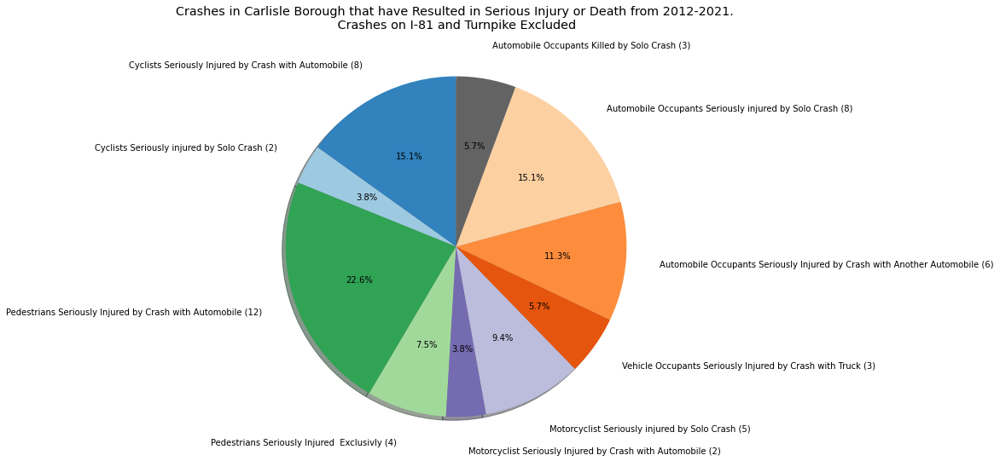

In [511]:
sizes=list(LOCAL_CRASH_PIECHART_DICT.values())

labels=list(LOCAL_CRASH_PIECHART_DICT.keys())


color_map=plt.colormaps['tab20c']
pie_colors =color_map([0, 2, 8, 10, 12, 14, 4, 5,  7,16 ])


plt.figure(figsize=(8,8))
#fig1, ax1 = plt.subplots()

plt.pie(sizes,
        labels=labels,
        autopct='%1.1f%%',
        shadow=True,
        startangle=90,
        labeldistance=1.2,
       colors= pie_colors)
#ax1.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%',
 #       shadow=True, startangle=90)
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

plt.title('Crashes in Carlisle Borough that have Resulted in Serious Injury or Death from 2012-2021.\n Crashes on I-81 and Turnpike Excluded\n\n', fontsize='x-large')
plt.show()


In [443]:
LOCAL_CRASH_PIECHART_DICT

{'Cyclists Seriously Injured by Crash with Automobile (8)': 8,
 'Cyclists Seriously injured by Solo Crash (2)': 2,
 'Pedestrians Seriously Injured by Crash with Automobile (12)': 12,
 'Pedestrians Seriously Injured  Exclusivly (4)': 4,
 'Motorcyclist Seriously Injured by Crash with Automobile (2)': 2,
 'Motorcyclist Seriously injured by Solo Crash (5)': 5,
 'Automobile Occupants Seriously Injured by Crash with Truck (3)': 3,
 'Automobile Occupants Seriously Injured by Crash with Another Automobile (6)': 6,
 'Automobile Occupants Seriously injured by Solo Crash (8)': 8,
 'Automobile Occupants Killed by Solo Crash (2)': 2,
 'Unknown Killed in Crash (1)': 1}

In [444]:
# remove empty values in Local Crash Pie Chart Dictionary 
# remove totals from Dictionary 

NEW_CRASH_DICT={}

for key in LOCAL_CRASH_PIECHART_DICT:
    if LOCAL_CRASH_PIECHART_DICT[key]!=0: # if the value doesn't equal zero 
        if key[-12:0]=="Automobile":
            NEW_CRASH_DICT["{} ({})".format(key,LOCAL_CRASH_PIECHART_DICT[key])]=LOCAL_CRASH_PIECHART_DICT[key]
        else:
            None
    else:
        None
        #NEW_CRASH_DICT[key]=LOCAL_CRASH_PIECHART_DICT[key]

LOCAL_CAR_CRASH_PIECHART_DICT=NEW_CRASH_DICT

LOCAL_CAR_CRASH_PIECHART_DICT

{}

In [497]:
Car_crash_keys=['Cyclists Seriously Injured by Crash with Automobile (8)',
                                         'Pedestrians Seriously Injured by Crash with Automobile (12)',
                                         'Motorcyclist Seriously Injured by Crash with Automobile (2)',
                                         'Vehicle Occupants Seriously Injured by Crash with Truck (3)',
                                         'Automobile Occupants Seriously Injured by Crash with Another Automobile (6)']

sizes= list([LOCAL_CAR_CRASH_PIECHART_DICT.get(key) for key in Car_crash_keys])
print(sizes)

[None, None, None, None, None]


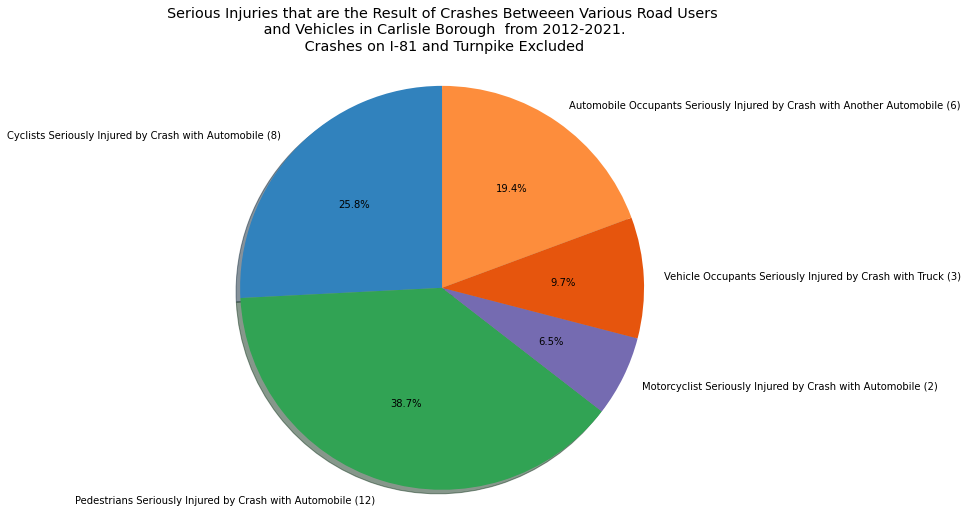

In [502]:

Car_crash_keys=['Cyclists Seriously Injured by Crash with Automobile (8)',
                'Pedestrians Seriously Injured by Crash with Automobile (12)',
                'Motorcyclist Seriously Injured by Crash with Automobile (2)',
                'Vehicle Occupants Seriously Injured by Crash with Truck (3)',
                'Automobile Occupants Seriously Injured by Crash with Another Automobile (6)']

sizes= list([LOCAL_CRASH_PIECHART_DICT.get(key) for key in Car_crash_keys])


labels=Car_crash_keys

color_map=plt.colormaps['tab20c']
pie_colors =color_map([0, 8,12,4,5 ])


plt.figure(figsize=(8,8))
#fig1, ax1 = plt.subplots()

plt.pie(sizes,
        labels=labels,
        autopct='%1.1f%%',
        shadow=True,
        startangle=90,
       colors= pie_colors)
#ax1.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%',
 #       shadow=True, startangle=90)
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

plt.title('Serious Injuries that are the Result of Crashes Betweeen Various Road Users\n and Vehicles in Carlisle Borough  from 2012-2021.\n Crashes on I-81 and Turnpike Excluded\n', fontsize='x-large')
plt.show()


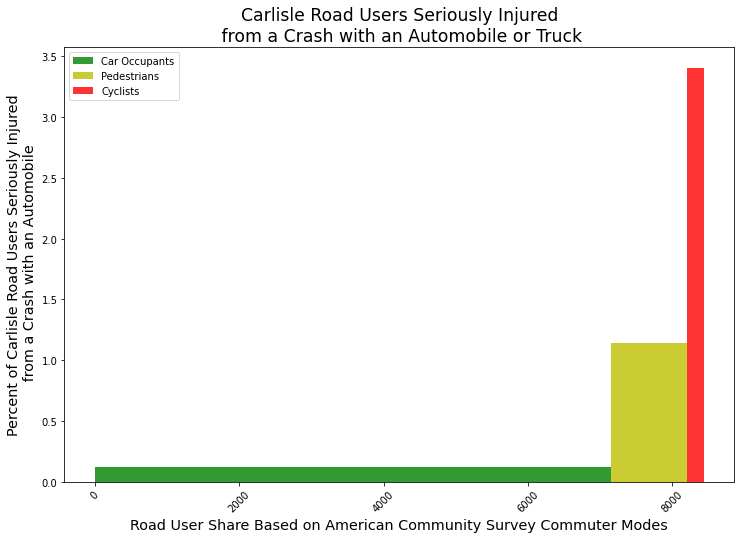

In [499]:
# create a Proportional Bar Chart


severe_pedestrian_on_auto = LOCAL_CRASH_PIECHART_DICT['Pedestrians Seriously Injured by Crash with Automobile (12)']

severe_cyclist_on_auto = LOCAL_CRASH_PIECHART_DICT['Cyclists Seriously Injured by Crash with Automobile (8)']

severe_auto_on_auto = LOCAL_CRASH_PIECHART_DICT['Automobile Occupants Seriously Injured by Crash with Another Automobile (6)']+LOCAL_CRASH_PIECHART_DICT['Vehicle Occupants Seriously Injured by Crash with Truck (3)']


#bike to work risk of severe injury 

#Walk to work risk of severe injury 

#Public transit to work risk of severe injury 

#Carpool to work risk of severe injury 

#Drive solo to work risk of severe injury 

#other to work risk of severe injury 


y = [(severe_auto_on_auto/(ACS_MUNI_DF['CARPOOL_TO_WORK_EST'].values[0]+ACS_MUNI_DF['DRIVE_SOLO_TO_WORK_EST'].values[0]))*100,
(severe_pedestrian_on_auto/ACS_MUNI_DF['WALK_TO_WORK_EST'].values[0])*100,
     (severe_cyclist_on_auto/ACS_MUNI_DF['BIKE_TO_WORK_EST'].values[0])*100]
     


w=[(ACS_MUNI_DF['CARPOOL_TO_WORK_EST'].values[0]+ACS_MUNI_DF['DRIVE_SOLO_TO_WORK_EST'].values[0]), (ACS_MUNI_DF['WALK_TO_WORK_EST'].values[0]),(ACS_MUNI_DF['BIKE_TO_WORK_EST'].values[0])]






x = ["Car Occupants",
     "Pedestrians",
     "Cyclists",]


#print('risk values{}'.format(y))
#print('risk multiplierfor cycling: {}'.format((y[0]/y[2])))
#print(w)
#y = [-25, -10, 5, 10, 30, 40,30]

#w = [30, 20, 25, 40, 20, 40, 40, 30]

colors = ["green","y","red"]

#plt.bar(x, height = y, width = w, color = colors, alpha = 0.8)

xticks=[]
for n, c in enumerate(w):
    xticks.append(sum(w[:n]) + w[n]/2)
plt.figure(figsize=(12,8))
#w_new = [i/max(w) for i in w]
a = plt.bar(xticks, height = y, width = w, color = colors, alpha = 0.8)
#_ = plt.xticks(xticks, x)

plt.title("Carlisle Road Users Seriously Injured\n from a Crash with an Automobile or Truck",fontsize='xx-large')
plt.ylabel('Percent of Carlisle Road Users Seriously Injured\n from a Crash with an Automobile',fontsize='x-large')
plt.xlabel('Road User Share Based on American Community Survey Commuter Modes',fontsize='x-large')
plt.xticks(rotation=45)
plt.legend(a.patches, x, loc='upper left')
plt.show()

In [448]:
# counts for Automobiles 
#Injured
#Belted Injured 

#Belted Automobile Occupants Severely Injured
LOCAL_CRASH_PIECHART_DICT['Total Belted Automobile Occupants Seriously Injured'] = LOCAL_STREETS_CRASH_DF['BELTED_SUSP_SERIOUS_INJ_COUNT'].sum()

#Belted Automobile Occupants Severely Injured by Crash with Automobile 
LOCAL_CRASH_PIECHART_DICT['Belted Automobile Occupants Seriously Injured by Crash with Automobile'] = LOCAL_STREETS_CRASH_DF['BELTED_SUSP_SERIOUS_INJ_COUNT'][(LOCAL_STREETS_CRASH_DF['AUTOMOBILE_COUNT']>1)].sum()  # involves 1 or more automobiles and sum results 
                                                                            

#Belted Automobile Occupants Severely injured by Crash with Other Motorcycle
LOCAL_CRASH_PIECHART_DICT['Belted Automobile Occupants Seriously Injured by Crash with Other Motorcycle'] = LOCAL_STREETS_CRASH_DF['BELTED_SUSP_SERIOUS_INJ_COUNT'][(LOCAL_STREETS_CRASH_DF['MOTORCYCLE_COUNT']>0)].sum() #involved more than one motorcycle and sum results

#Belted Automobile Occupants Severely injured by Crash with other cyclist
LOCAL_CRASH_PIECHART_DICT['Belted Automobile Occupants Seriously Injured by Crash with  Cyclist'] = LOCAL_STREETS_CRASH_DF['BELTED_SUSP_SERIOUS_INJ_COUNT'][(LOCAL_STREETS_CRASH_DF['BICYCLE_COUNT']>0)].sum() # involves 1 or more Bicycles and sum results 

#Belted Automobile Occupants Severely injured by Solo Crash
LOCAL_CRASH_PIECHART_DICT['Belted Automobile Occupants Seriously injured by Solo Crash'] = LOCAL_STREETS_CRASH_DF['BELTED_SUSP_SERIOUS_INJ_COUNT'][(LOCAL_STREETS_CRASH_DF['BICYCLE_COUNT']==0)&     # involving no bicycles
                                                                                                                                                  (LOCAL_STREETS_CRASH_DF['AUTOMOBILE_COUNT']==1)&      # involving one Automobiles
                                                                                                                                                   (LOCAL_STREETS_CRASH_DF['MOTORCYCLE_COUNT']==0)].sum()# involving no motorcycles and sum results
         
# Unbelted Automobile Occupants Severely Injured
LOCAL_CRASH_PIECHART_DICT['Total Unbelted Automobile Occupants Seriously Injured'] = LOCAL_STREETS_CRASH_DF['UNB_SUSP_SERIOUS_INJ_COUNT'].sum()

# Unbelted Automobile Occupants Severely Injured by Crash with Automobile 
LOCAL_CRASH_PIECHART_DICT['Unbelted Automobile Occupants Seriously Injured by Crash with Other Automobile'] = LOCAL_STREETS_CRASH_DF['UNB_SUSP_SERIOUS_INJ_COUNT'][(LOCAL_STREETS_CRASH_DF['AUTOMOBILE_COUNT']>1)].sum()  # involves 1 or more automobiles and sum results 
                          
    
    
# Unbelted Automobile Occupants Severely Injured by Crash with HeaveyTruck 
LOCAL_CRASH_PIECHART_DICT['Unbelted Automobile Occupants Seriously Injured by Crash with truck'] = LOCAL_STREETS_CRASH_DF['UNB_SUSP_SERIOUS_INJ_COUNT'][(LOCAL_STREETS_CRASH_DF['HEAVY_TRUCK_COUNT']>0)].sum()  # involves 1 or more automobiles and sum results 
                                            
    
    
# Unbelted Automobile Occupants Severely injured by Crash with Other Motorcycle
LOCAL_CRASH_PIECHART_DICT['Unbelted Automobile Occupants Seriously Injured by Crash with Motorcycle'] = LOCAL_STREETS_CRASH_DF['UNB_SUSP_SERIOUS_INJ_COUNT'][(LOCAL_STREETS_CRASH_DF['MOTORCYCLE_COUNT']>0)].sum() #involved one or more motorcycles and sum results

# Unbelted Automobile Occupants Severely injured by Crash with other cyclist
LOCAL_CRASH_PIECHART_DICT['Unbelted Automobile Occupants Seriously Injured by Crash with  Cyclist'] = LOCAL_STREETS_CRASH_DF['UNB_SUSP_SERIOUS_INJ_COUNT'][(LOCAL_STREETS_CRASH_DF['BICYCLE_COUNT']>0)].sum() # involves 1 or more Bicycles and sum results 

# Unbelted Automobile Occupants Severely injured by Solo Crash
LOCAL_CRASH_PIECHART_DICT['Unbelted Automobile Occupants Seriously injured by Solo Crash'] = LOCAL_STREETS_CRASH_DF['UNB_SUSP_SERIOUS_INJ_COUNT'][(LOCAL_STREETS_CRASH_DF['BICYCLE_COUNT']==0)&          # involving no bicycles
                                                                                                                                                  (LOCAL_STREETS_CRASH_DF['AUTOMOBILE_COUNT']==1)&      # involving one Automobiles
                                                                                                                                                  (LOCAL_STREETS_CRASH_DF['MOTORCYCLE_COUNT']==0)].sum()# involving no motorcycles and sum results
                                                                                                                                                  
#Killed                                                                                                                                                 

#Total Belted Automobile Occupants Killed
LOCAL_CRASH_PIECHART_DICT['Total Belted Automobile Occupants Killed']= LOCAL_STREETS_CRASH_DF['BELTED_DEATH_COUNT'].sum()

#Belted Automobile Occupants Killed by Crash with Automobile 
LOCAL_CRASH_PIECHART_DICT['Belted Automobile Occupants Killed by Crash with Other Automobile']= LOCAL_STREETS_CRASH_DF['BELTED_DEATH_COUNT'][(LOCAL_STREETS_CRASH_DF['AUTOMOBILE_COUNT']>1)].sum()  # involves 2 or more Bicycles and sum results
                                                                                

#Belted Automobile Occupants Killed by Crash with Motorcycle
LOCAL_CRASH_PIECHART_DICT['Belted Automobile Occupants Killed by Crash with Motorcycle']= LOCAL_STREETS_CRASH_DF['BELTED_DEATH_COUNT'][(LOCAL_STREETS_CRASH_DF['MOTORCYCLE_COUNT']>0)].sum()# involves one or more Motorcycles and sum results 

#Belted Automobile Occupants Killed by Crash with other cyclist
LOCAL_CRASH_PIECHART_DICT['Belted Automobile Occupants Killed by Crash with cyclist'] = LOCAL_STREETS_CRASH_DF['BELTED_DEATH_COUNT'][(LOCAL_STREETS_CRASH_DF['BICYCLE_COUNT']>0)].sum() # involves 1 or more automobiles
#Belted Automobile Occupants Killed by Solo Crash
LOCAL_CRASH_PIECHART_DICT['Belted Automobile Occupants Killed by Solo Crash'] = LOCAL_STREETS_CRASH_DF['BELTED_DEATH_COUNT'][(LOCAL_STREETS_CRASH_DF['BICYCLE_COUNT']==0)&              # no bicycles    involved
                                                                                                              (LOCAL_STREETS_CRASH_DF['AUTOMOBILE_COUNT']==1)&           # no automobiles invovled
                                                                                                              (LOCAL_STREETS_CRASH_DF['MOTORCYCLE_COUNT']==0)].sum() 


# Total Unbelted Automobile Occupants Killed
LOCAL_CRASH_PIECHART_DICT['Total Unbelted Automobile Occupants Killed']= LOCAL_STREETS_CRASH_DF['UNB_DEATH_COUNT'].sum()

# Unbelted Automobile Occupants Killed by Crash with Automobile 
LOCAL_CRASH_PIECHART_DICT['Unbelted Automobile Occupants Killed by Crash with Other Automobile']= LOCAL_STREETS_CRASH_DF['UNB_DEATH_COUNT'][(LOCAL_STREETS_CRASH_DF['AUTOMOBILE_COUNT']>1)].sum()  # involves 2 or more Bicycles and sum results
                                                                                

# Unbelted Automobile Occupants Killed by Crash with Motorcycle
LOCAL_CRASH_PIECHART_DICT['Unbelted Automobile Occupants Killed by Crash with Motorcycle']= LOCAL_STREETS_CRASH_DF['UNB_DEATH_COUNT'][(LOCAL_STREETS_CRASH_DF['MOTORCYCLE_COUNT']>0)].sum()# involves one or more Motorcycles and sum results 

# Unbelted Automobile Occupants Killed by Crash with other cyclist
LOCAL_CRASH_PIECHART_DICT['Unbelted Automobile Occupants Killed by Crash with cyclist'] = LOCAL_STREETS_CRASH_DF['UNB_DEATH_COUNT'][(LOCAL_STREETS_CRASH_DF['BICYCLE_COUNT']>0)].sum() # involves 1 or more automobiles

# Unbelted Automobile Occupants Killed by Solo Crash
LOCAL_CRASH_PIECHART_DICT['Unbelted Automobile Occupants Killed by Solo Crash'] = LOCAL_STREETS_CRASH_DF['UNB_DEATH_COUNT'][(LOCAL_STREETS_CRASH_DF['BICYCLE_COUNT']==0)&              # no bicycles    involved
                                                                                                                             (LOCAL_STREETS_CRASH_DF['AUTOMOBILE_COUNT']==1)&    
                                                                                                                             (LOCAL_STREETS_CRASH_DF['MOTORCYCLE_COUNT']==0)].sum()# involving no motorcycles and sum results# no automobiles invovled
                          

# Unbeldted

print('CHECK DICTIONARY TO BE SURE THERE ARE NO DOUBLE COUNTS OR MISSING VALUES\n')

LOCAL_CRASH_PIECHART_DICT

CHECK DICTIONARY TO BE SURE THERE ARE NO DOUBLE COUNTS OR MISSING VALUES



{'Cyclists Seriously Injured by Crash with Automobile (8)': 8,
 'Cyclists Seriously injured by Solo Crash (2)': 2,
 'Pedestrians Seriously Injured by Crash with Automobile (12)': 12,
 'Pedestrians Seriously Injured  Exclusivly (4)': 4,
 'Motorcyclist Seriously Injured by Crash with Automobile (2)': 2,
 'Motorcyclist Seriously injured by Solo Crash (5)': 5,
 'Automobile Occupants Seriously Injured by Crash with Truck (3)': 3,
 'Automobile Occupants Seriously Injured by Crash with Another Automobile (6)': 6,
 'Automobile Occupants Seriously injured by Solo Crash (8)': 8,
 'Automobile Occupants Killed by Solo Crash (2)': 2,
 'Unknown Killed in Crash (1)': 1,
 'Total Belted Automobile Occupants Seriously Injured': 14,
 'Belted Automobile Occupants Seriously Injured by Crash with Automobile': 6,
 'Belted Automobile Occupants Seriously Injured by Crash with Other Motorcycle': 0,
 'Belted Automobile Occupants Seriously Injured by Crash with  Cyclist': 0,
 'Belted Automobile Occupants Seriousl